# In the Name of God, the Compassionate, the Merciful
# Coronovirus Forecasting

## Phase 1: Forecasting cases and deaths in Iran using local data only
### Step 1: Data preprocessing

#### Importing data

In [131]:
import pandas as pd
ic = pd.read_excel("D:\DS\Mine\Corona\I21-11.xlsx") # Iran Corona for Nov 2021
pd.set_option('display.max_columns', None)
#pd.set_option('display.max_rows', 30)
ic.head(10)

,date,datei,total_cases,new_cases,new_cases_smoothed,total_deaths,new_deaths,new_deaths_smoothed,total_cases_per_million,new_cases_per_million,new_cases_smoothed_per_million,total_deaths_per_million,new_deaths_per_million,new_deaths_smoothed_per_million,reproduction_rate,new_tests,total_tests,total_tests_per_thousand,new_tests_per_thousand,new_tests_smoothed,new_tests_smoothed_per_thousand,positive_rate,tests_per_case,tests_units,total_vaccinations,people_vaccinated,people_fully_vaccinated,total_boosters,new_vaccinations,new_vaccinations_smoothed,total_vaccinations_per_hundred,people_vaccinated_per_hundred,people_fully_vaccinated_per_hundred,total_boosters_per_hundred,new_vaccinations_smoothed_per_million,new_people_vaccinated_smoothed,new_people_vaccinated_smoothed_per_hundred,stringency_index,population,population_density,median_age,aged_65_older,aged_70_older,gdp_per_capita,extreme_poverty,cardiovasc_death_rate,diabetes_prevalence,female_smokers,male_smokers,hospital_beds_per_thousand,life_expectancy,human_development_index,excess_mortality_cumulative_absolute,excess_mortality_cumulative,excess_mortality,excess_mortality_cumulative_per_million
0,2020-02-19,43880,2,2,NaN,2,2,NaN,0,0,NaN,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,0,0,0,0,0,0,0,0,0,0,0,0,0,85028760,50,32,5,3,"19,083",0,270,10,1,21,2,77,1,NaN,NaN,NaN,NaN
1,2020-02-20,43881,5,3,NaN,2,0,NaN,0,0,NaN,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,0,0,0,0,0,0,0,0,0,0,0,0,3,85028760,50,32,5,3,"19,083",0,270,10,1,21,2,77,1,NaN,NaN,NaN,NaN
2,2020-02-21,43882,18,13,NaN,4,2,NaN,0,0,NaN,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,0,0,0,0,0,0,0,0,0,0,0,0,3,85028760,50,32,5,3,"19,083",0,270,10,1,21,2,77,1,NaN,NaN,NaN,NaN
3,2020-02-22,43883,28,10,NaN,5,1,NaN,0,0,NaN,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,0,0,0,0,0,0,0,0,0,0,0,0,11,85028760,50,32,5,3,"19,083",0,270,10,1,21,2,77,1,NaN,NaN,NaN,NaN
4,2020-02-23,43884,43,15,NaN,8,3,NaN,1,0,NaN,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,0,0,0,0,0,0,0,0,0,0,0,0,11,85028760,50,32,5,3,"19,083",0,270,10,1,21,2,77,1,"-2,658",-4,3,-31
5,2020-02-24,43885,61,18,9,12,4,2,1,0,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,0,0,0,0,0,0,0,0,0,0,0,0,11,85028760,50,32,5,3,"19,083",0,270,10,1,21,2,77,1,NaN,NaN,NaN,NaN
6,2020-02-25,43886,95,34,14,16,4,2,1,0,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,0,0,0,0,0,0,0,0,0,0,0,0,11,85028760,50,32,5,3,"19,083",0,270,10,1,21,2,77,1,NaN,NaN,NaN,NaN
7,2020-02-26,43887,139,44,20,19,3,2,2,1,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,0,0,0,0,0,0,0,0,0,0,0,0,20,85028760,50,32,5,3,"19,083",0,270,10,1,21,2,77,1,NaN,NaN,NaN,NaN
8,2020-02-27,43888,245,106,34,26,7,3,3,1,0,0,0,0,5,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,0,0,0,0,0,0,0,0,0,0,0,0,20,85028760,50,32,5,3,"19,083",0,270,10,1,21,2,77,1,NaN,NaN,NaN,NaN
9,2020-02-28,43889,388,143,53,34,8,4,5,2,1,0,0,0,5,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,0,0,0,0,0,0,0,0,0,0,0,0,20,85028760,50,32,5,3,"19,083",0,270,10,1,21,2,77,1,NaN,NaN,NaN,NaN


In [132]:
ic.shape

(649, 56)

#### Feature selection and missing data handling

In [133]:
ic.isnull().sum()

date                                            0
datei                                           0
total_cases                                     0
new_cases                                       0
new_cases_smoothed                              5
total_deaths                                    0
new_deaths                                      0
new_deaths_smoothed                             5
total_cases_per_million                         0
new_cases_per_million                           0
new_cases_smoothed_per_million                  5
total_deaths_per_million                        0
new_deaths_per_million                          0
new_deaths_smoothed_per_million                 5
reproduction_rate                              11
new_tests                                     397
total_tests                                   276
total_tests_per_thousand                      276
new_tests_per_thousand                        397
new_tests_smoothed                             54


In [134]:
# To simplify the model, at this stage we chose the following columns and eliminated the rest:
# 'date', 'datei', 'total_cases', 'new_cases', 'new_cases_smoothed', 'total_deaths', 'new_deaths', 'new_deaths_smoothed'

# The field total_vaccinations has missing values in Iran and it is appropriate to interpolate:
#  Initial values before the first vaccination were logically set to 0. Interpolation was used afterwards. 
#  The final missing values are going to be interpolated by the final available value.

q = ic['total_vaccinations'].interpolate(method='linear')
q.tail(20).astype(int)

629     95866990
630     96445592
631     97024195
632     97602797
633     98181400
634     98676878
635     99172357
636     99667835
637    100163314
638    100658793
639    101154271
640    101649750
641    102145229
642    102145229
643    102145229
644    102145229
645    102145229
646    102145229
647    102145229
648    102145229
Name: total_vaccinations, dtype: int32

In [135]:
# Insert a column as total_vaccinations_f (fillied out / full)
ic['total_vaccinations_f'] = q

In [136]:
# Stringency index has some missing values. It is appropriate to fill it out using forward fill.
# Insert a new column
ic['stringency_index_f'] = ic['stringency_index'].fillna(method="ffill")

In [137]:
ic

,date,datei,total_cases,new_cases,new_cases_smoothed,total_deaths,new_deaths,new_deaths_smoothed,total_cases_per_million,new_cases_per_million,new_cases_smoothed_per_million,total_deaths_per_million,new_deaths_per_million,new_deaths_smoothed_per_million,reproduction_rate,new_tests,total_tests,total_tests_per_thousand,new_tests_per_thousand,new_tests_smoothed,new_tests_smoothed_per_thousand,positive_rate,tests_per_case,tests_units,total_vaccinations,people_vaccinated,people_fully_vaccinated,total_boosters,new_vaccinations,new_vaccinations_smoothed,total_vaccinations_per_hundred,people_vaccinated_per_hundred,people_fully_vaccinated_per_hundred,total_boosters_per_hundred,new_vaccinations_smoothed_per_million,new_people_vaccinated_smoothed,new_people_vaccinated_smoothed_per_hundred,stringency_index,population,population_density,median_age,aged_65_older,aged_70_older,gdp_per_capita,extreme_poverty,cardiovasc_death_rate,diabetes_prevalence,female_smokers,male_smokers,hospital_beds_per_thousand,life_expectancy,human_development_index,excess_mortality_cumulative_absolute,excess_mortality_cumulative,excess_mortality,excess_mortality_cumulative_per_million,total_vaccinations_f,stringency_index_f
0,2020-02-19,43880,2,2,NaN,2,2,NaN,0,0,NaN,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,0,0,0,0,0,0,0,0,0,0,0,0,0,85028760,50,32,5,3,"19,083",0,270,10,1,21,2,77,1,NaN,NaN,NaN,NaN,0,0
1,2020-02-20,43881,5,3,NaN,2,0,NaN,0,0,NaN,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,0,0,0,0,0,0,0,0,0,0,0,0,3,85028760,50,32,5,3,"19,083",0,270,10,1,21,2,77,1,NaN,NaN,NaN,NaN,0,3
2,2020-02-21,43882,18,13,NaN,4,2,NaN,0,0,NaN,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,0,0,0,0,0,0,0,0,0,0,0,0,3,85028760,50,32,5,3,"19,083",0,270,10,1,21,2,77,1,NaN,NaN,NaN,NaN,0,3
3,2020-02-22,43883,28,10,NaN,5,1,NaN,0,0,NaN,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,0,0,0,0,0,0,0,0,0,0,0,0,11,85028760,50,32,5,3,"19,083",0,270,10,1,21,2,77,1,NaN,NaN,NaN,NaN,0,11
4,2020-02-23,43884,43,15,NaN,8,3,NaN,1,0,NaN,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,0,0,0,0,0,0,0,0,0,0,0,0,11,85028760,50,32,5,3,"19,083",0,270,10,1,21,2,77,1,"-2,658",-4,3,-31,0,11
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
644,2021-11-24,44524,6092822,4813,"4,990",129280,103,107,"71,656",57,59,"1,520",1,1,1,"111,047","38,107,951",448,1,"114,423",1,0,23,tests performed,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,85028760,50,32,5,3,"19,083",0,270,10,1,21,2,77,1,NaN,NaN,NaN,NaN,"102,145,229",70
645,2021-11-25,44525,6097672,4850,"4,842",129376,96,106,"71,713",57,57,"1,522",1,1,1,"111,296","38,219,247",449,1,"122,812",1,0,25,tests performed,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,85028760,50,32,5,3,"19,083",0,270,10,1,21,2,77,1,NaN,NaN,NaN,NaN,"102,145,229",70
646,2021-11-26,44526,6102056,4384,"4,642",129462,86,104,"71,765",52,55,"1,523",1,1,NaN,"112,299","38,331,546",451,1,"108,126",1,0,23,tests performed,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,85028760,50,32,5,3,"19,083",0,270,10,1,21,2,77,1,NaN,NaN,NaN,NaN,"102,145,229",70
647,2021-11-27,44527,6105101,3045,"4,572",129549,87,100,"71,800",36,54,"1,524",1,1,NaN,"107,694","38,439,240",452,1,"108,763",1,0,24,tests performed,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,85028760,50,32,5,3,"19,083",0,270,10,1,21,2,77,1,NaN,NaN,NaN,NaN,"102,145,229",70


In [148]:
# Create a new clean dataframe based on values that are expected to be more useful at this stage.
# To eliminate rows with missing values for the first few days (smoothed fields), the new dataframe starts from index:6.
icf = ic.loc[6: , ['date', 'datei', 'total_cases', 'new_cases', 'new_cases_smoothed', 'total_deaths', 'new_deaths', 'new_deaths_smoothed', 'total_vaccinations_f', 'stringency_index_f']]
pd.options.display.float_format = '{:,.0f}'.format
icf


,date,datei,total_cases,new_cases,new_cases_smoothed,total_deaths,new_deaths,new_deaths_smoothed,total_vaccinations_f,stringency_index_f
6,2020-02-25,43886,95,34,14,16,4,2,0,11
7,2020-02-26,43887,139,44,20,19,3,2,0,20
8,2020-02-27,43888,245,106,34,26,7,3,0,20
9,2020-02-28,43889,388,143,53,34,8,4,0,20
10,2020-02-29,43890,593,205,81,43,9,5,0,20
...,...,...,...,...,...,...,...,...,...,...
644,2021-11-24,44524,6092822,4813,"4,990",129280,103,107,"102,145,229",70
645,2021-11-25,44525,6097672,4850,"4,842",129376,96,106,"102,145,229",70
646,2021-11-26,44526,6102056,4384,"4,642",129462,86,104,"102,145,229",70
647,2021-11-27,44527,6105101,3045,"4,572",129549,87,100,"102,145,229",70


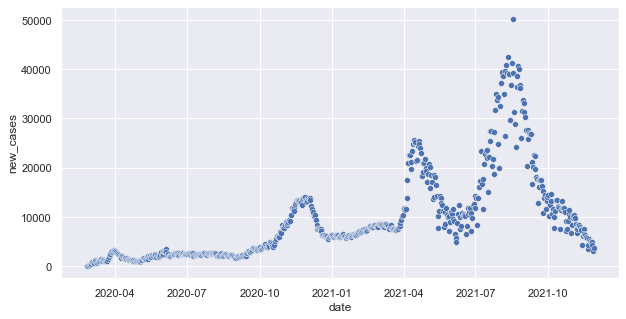

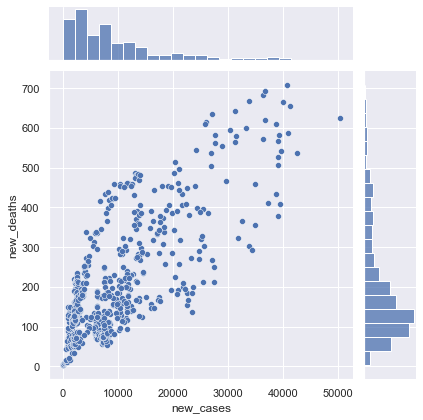

In [151]:
# A few initial look at the data:
import seaborn as sb
sb.set(rc={'figure.figsize':(10, 5)})     #For A4: 11.7, 8.27
sb.scatterplot(x=icf['date'], y=icf['new_cases'])
sb.jointplot(x=icf['new_cases'], y=icf['new_deaths'])

<AxesSubplot:xlabel='total_vaccinations_f', ylabel='new_deaths'>

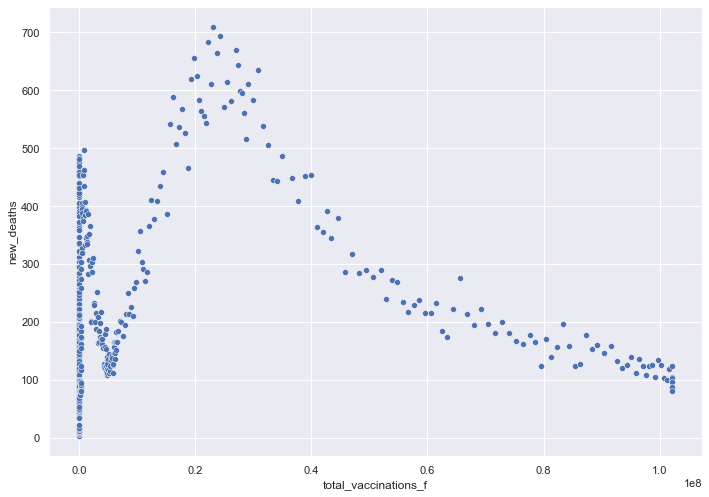

In [140]:
sb.scatterplot(y='new_deaths', x='total_vaccinations_f', data=icf)

In [141]:
# If you don't have pandas_profiling on your system, you can install it using the following instruction.
# pip install pandas_profiling
from pandas_profiling import profile_report
icf.profile_report()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

#### Data duplication handling

In [142]:
icf.duplicated(subset=['datei']).sum()

0

In [143]:
# No duplicate data was found based on date. 
# As data is being updated on daily basis, it is unlikely to have duplicates from this source.

#### Noise and outlier handling

In [144]:
# In icf.profile_report() we can see the minimum of different features is not negative. The maximum values make sence. 
# The graphs of different features vs date look normal, with no hiccups (sharp up/downs).
# The maximum new_cases of 50228 (2021-08-17) or lower values are not considered noise. 
# And for now, they are not considered outlier either.
# No noise or outlier were detected in our data.

# In icf.profile_report(): All the alerts were reviewed and all of them make sence.

#### Features

In [145]:
# A more general review of the data using:
# selected fields with focus on smoothed features and independent ones.
icf1 = icf = ic.loc[6: , ['datei', 'new_cases_smoothed', 'new_deaths_smoothed', 'total_vaccinations_f', 
                          'stringency_index_f']]
icf1

,datei,new_cases_smoothed,new_deaths_smoothed,total_vaccinations_f,stringency_index_f
6,43886,14,2,0,11
7,43887,20,2,0,20
8,43888,34,3,0,20
9,43889,53,4,0,20
10,43890,81,5,0,20
...,...,...,...,...,...
644,44524,"4,990",107,"102,145,229",70
645,44525,"4,842",106,"102,145,229",70
646,44526,"4,642",104,"102,145,229",70
647,44527,"4,572",100,"102,145,229",70


In [146]:

icf1.profile_report()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [3]:
train = list([10, 20, 30, 45])
history = [x for x in train]
history, train

([10, 20, 30, 45], [10, 20, 30, 45])